#### Comparing the gene signatures across three fetal stem cells populations and LGR5+/- cells 
- **Developed by:** Anna Maguza
- **Affilation:** Faculty of Medicine, Würzburg University
- **Date of creation:** 10th September 2024
- **Last modified date:** 10th September 2024

This notebook is compare and score signatures of adult LGR5+ ISCs subsets identified in Biton, 2018 (mice cells) to human fetal stem cells. The common set of genes was obtained using `ensembl`orthologues.  


+ Import packages

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np

+ Load fetal cells

In [2]:
fetal_adata = sc.read_h5ad("data/Fetal_cells_filtered_raw.h5ad")

+ Normalize fetal cells

In [3]:
fetal_adata_log = fetal_adata.copy()
sc.pp.normalize_total(fetal_adata_log, target_sum = 1e6, exclude_highly_expressed = True) #1e6 because it is 10X
sc.pp.log1p(fetal_adata_log)

In [4]:
fetal_adata_log = fetal_adata_log[fetal_adata_log.obs['Cell States'].isin(['MTRNR2L12+ASS1+_SC', 'TA', 'RPS10+_RPS17+_SC',
                                                                           'FXYD3+_CKB+_SC'])]

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [5]:
fetal_adata_log_copy = fetal_adata_log.copy()

### Compare with ISC populations from Biton, 2018

In [6]:
orthologues_ensembl = pd.read_csv("database_data/ensembl_data/mouse_to_human_orthologues_ensembl.txt", sep = "\t")

In [7]:
isc_1 = pd.read_excel("data/Biton_2018/1-s2.0-S0092867418313163-mmc1.xlsx", sheet_name = "ISC-I")
isc_2 = pd.read_excel("data/Biton_2018/1-s2.0-S0092867418313163-mmc1.xlsx", sheet_name = "ISC-II")
isc_3 = pd.read_excel("data/Biton_2018/1-s2.0-S0092867418313163-mmc1.xlsx", sheet_name = "ISC-III")

In [8]:
isc_1.columns = isc_1.iloc[4]
isc_1 = isc_1.iloc[5:]

isc_2.columns = isc_2.iloc[4]
isc_2 = isc_2.iloc[5:]

isc_3.columns = isc_3.iloc[4]
isc_3 = isc_3.iloc[5:]

In [9]:
isc_datasets = [isc_1, isc_2, isc_3]
isc_human_sets = []

for isc_df in isc_datasets:
    merged = pd.merge(isc_df['Gene symbol'], orthologues_ensembl, left_on='Gene symbol', right_on='Gene name', how='left')
    human_orthologs = set(merged['Human gene name'].dropna().unique())
    isc_human_sets.append(human_orthologs)


In [10]:
len(isc_human_sets[0])

759

In [11]:
len(isc_human_sets[1])

718

In [12]:
len(isc_human_sets[2])

859

In [13]:
isc_1_genes = list(isc_human_sets[0])
isc_1_genes = isc_1_genes[:100]

isc_2_genes = list(isc_human_sets[1])
isc_2_genes = isc_2_genes[:100]

isc_3_genes = list(isc_human_sets[2])
isc_3_genes = isc_3_genes[:100]

In [14]:
fetal_adata_log = fetal_adata_log_copy.copy()
fetal_adata_log

AnnData object with n_obs × n_vars = 11684 × 25445
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells'
    uns: 'log1p'

In [15]:
sc.tl.score_genes(fetal_adata_log, gene_list=isc_1_genes, score_name='ISC1_score')
sc.tl.score_genes(fetal_adata_log, gene_list=isc_2_genes, score_name='ISC2_score')
sc.tl.score_genes(fetal_adata_log, gene_list=isc_3_genes, score_name='ISC3_score')

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated 

In [17]:
sc.set_figure_params(dpi=300, figsize=(10, 10))
sc.pl.violin(fetal_adata_log, keys=['ISC1_score', 'ISC2_score', 'ISC3_score'], groupby='Cell States', stripplot=True, inner="quartile")

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:770: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[groupby]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/amaguza/miniforge3/envs/scanpy_env/lib/python

* Check if the developmental stage makes a difference

In [22]:
fetal_adata_log.obs['cell_type_age_group'] = fetal_adata_log.obs['Cell States'].astype(str) + '_' + fetal_adata_log.obs['Age_group'].astype(str)

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:770: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[groupby]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/amaguza/miniforge3/envs/scanpy_env/lib/python

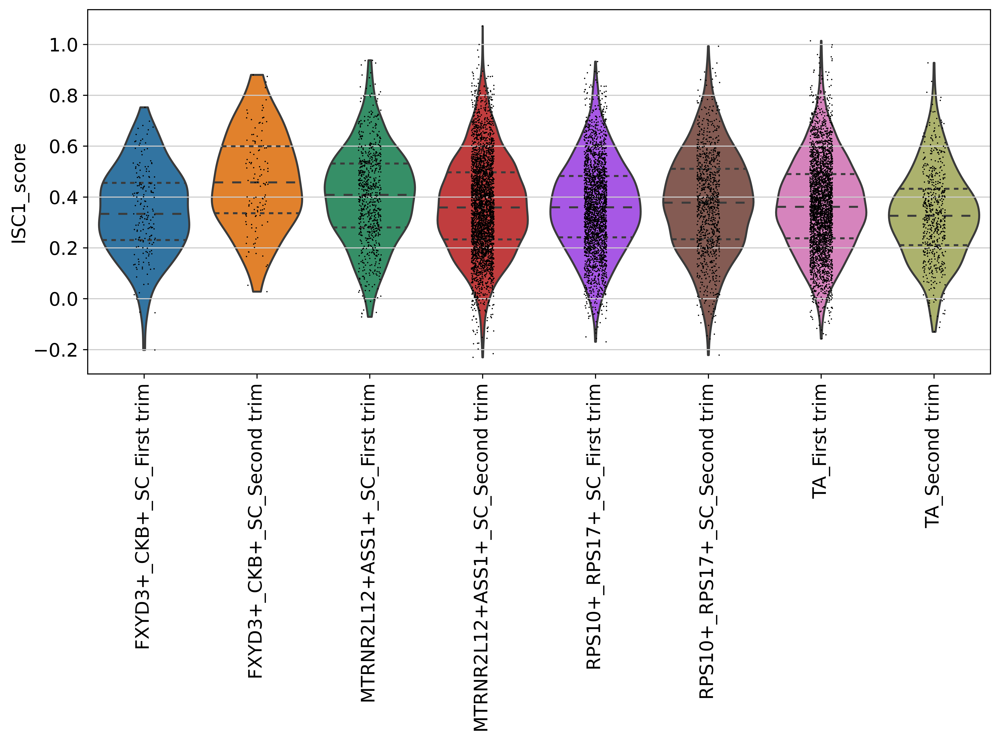

In [31]:
sc.set_figure_params(dpi=300, figsize=(10, 5))
sc.pl.violin(fetal_adata_log, keys=['ISC1_score'], groupby='cell_type_age_group', stripplot=True, inner="quartile", rotation=90)

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:770: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[groupby]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/amaguza/miniforge3/envs/scanpy_env/lib/python

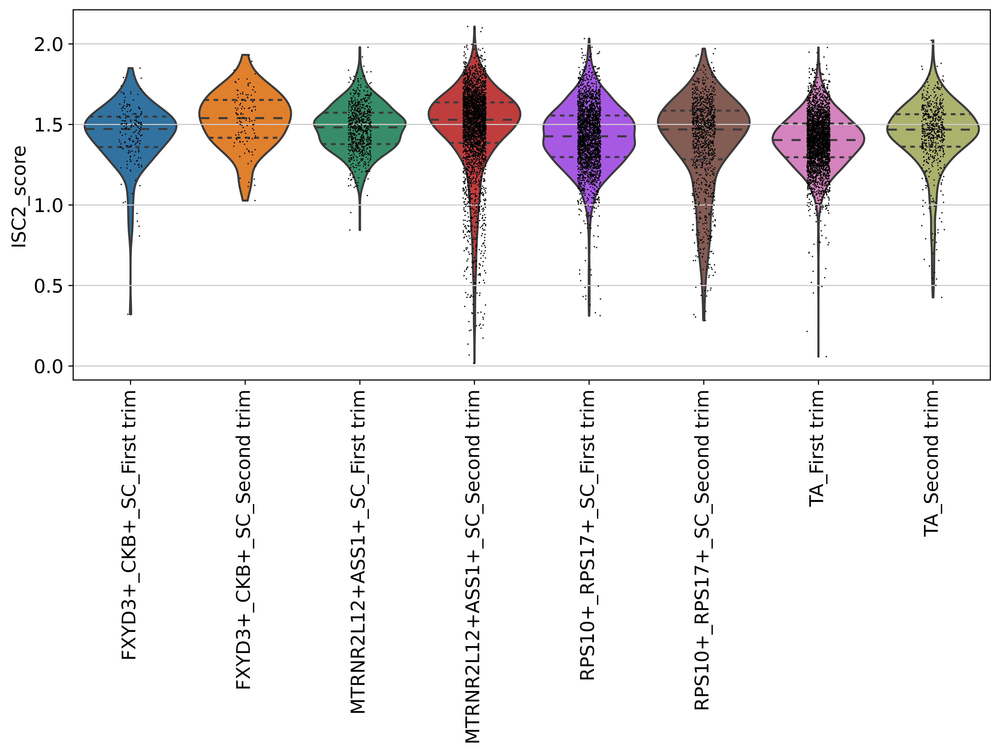

In [30]:
sc.set_figure_params(dpi=300, figsize=(10, 5))
sc.pl.violin(fetal_adata_log, keys=['ISC2_score'], groupby='cell_type_age_group', stripplot=True, inner="quartile", rotation=90)

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:770: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[groupby]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/home/amaguza/miniforge3/envs/scanpy_env/lib/python

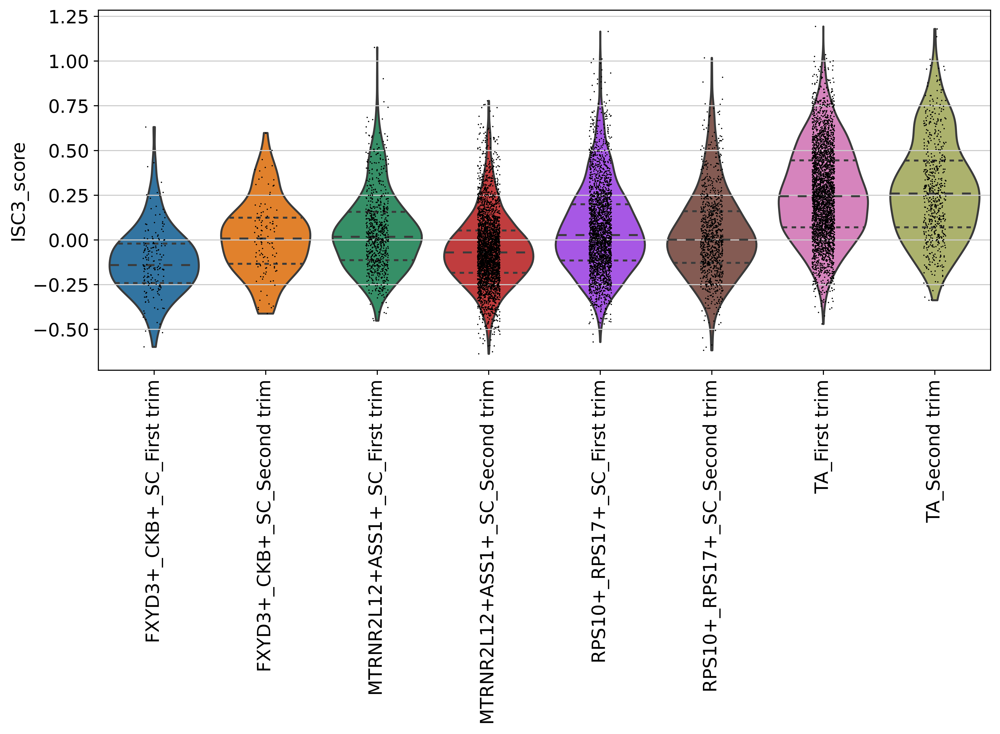

In [29]:
sc.set_figure_params(dpi=300, figsize=(10, 5))
sc.pl.violin(fetal_adata_log, keys=['ISC3_score'], groupby='cell_type_age_group', stripplot=True, inner="quartile", rotation=90)